In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## Communities based on hallmark genes

In [2]:
file_network = "~/6_network_analysis/foldseekCluster90_1E-5_network_evalue_below_1E-3_plddt_above_50.csv"
df_network = pd.read_csv(file_network)
file_hallmark = "./ext_hallmark_protein_vs_foldseekCluster90_1E-5_structure_reps/ext_hallmark_protein_vs_foldseekCluster90_1E-5_structure_reps.tsv"
#file_hallmark = "./hallmark_protein_vs_Viro3D/hallmark_protein_vs_Viro3D.tsv"
df_hallmark = pd.read_csv(file_hallmark, sep="\t")
file_stats = "~/7_functional_coverage_expansion/foldseekCluster90_1E-5_stats_single_go_1E-3.csv"
df_stats = pd.read_csv(file_stats)
file_meta = "~/4_structural_clustering/foldseekCluster90_1E-5/foldseekCluster90_1E-5_meta.csv"
df_meta = pd.read_csv(file_meta)

In [3]:
# merge df_hallmark and df_stats[['structure_representative', 'cluster_id']]
df_hallmark = df_hallmark.merge(df_stats[['structure_representative', 'cluster_id']], left_on='target', right_on='structure_representative', how='left')
df_hallmark.drop(columns=['structure_representative'], inplace=True)

In [4]:
hallmark_list = [
    '1_4r0e_polio_rdrp',
    '2_1hmv_hiv_rt_p66',
    '3_2py5_phi29_pPolB',
    '4_8h56_circovirus_rcre',
    '5_5a9k_papilloma_s3h',
    #'6a_8e86_polio_vp1_sjr',
    #'6b_8e86_polio_vp2_sjr',
    '6c_8e86_polio_vp3_sjr',
    '7_6b1t_adeno_hexon_djr',
    '8b_6lgl_vzv_hk97',
    #'SARS2_S_6VYB_A_MODEL_1',
    'RSV_F_6APB_A_MODEL_1',
    'Spondweni_E_6ZQI_A_MODEL_1',
    'HCMV_Gb_7KDP_A_MODEL_1',
    #'3C_protease_7l8h',
    #'VSV_protein_L_mRNA_capping_domain_6u1x',
    #'dUTPase_6mjk',
    #'SARS-CoV-2_RNA_helicase_7nio'
]

In [5]:
hallmark_clusters = {}


for hallmark in hallmark_list:
    
    # Get clusters that you can find with the hallmark structure (hallmark community)
    df_hallmark_sub = df_hallmark[(df_hallmark['query'] == hallmark) & (df_hallmark['evalue'] < 1e-5)]
    
    community_dict = {}

    # Store the position of the hallmark hit for each cluster
    for index, row in df_hallmark_sub.iterrows():
        community_dict[row['cluster_id']] = [row['tstart'], row['tend']]
    
    hallmark_community = set(community_dict.keys())
    extended_community = set(community_dict.keys())
    
    for cluster_id, coordinates in community_dict.items():
        
        df_network_sub = df_network[(df_network['query_cluster_id'] == cluster_id) & (df_network['evalue'] < 1e-5)]

        for index, row in df_network_sub.iterrows():
            
            coord_start = coordinates[0]
            coord_end = coordinates[1]
            hallmark_coord_list = set(range(coord_start, coord_end+1))
            
            qstart = row['qstart']
            qend = row['qend']
            network_coord_list = set(range(qstart, qend+1))

            intersection = round(len(hallmark_coord_list.intersection(network_coord_list)) / len(hallmark_coord_list), 2)

            if intersection >= 0.9:
                extended_community.add(row['target_cluster_id'])
    
    print(hallmark, len(hallmark_community), len(extended_community), sep='\t')

    #hallmark_clusters[hallmark] = hallmark_community
    hallmark_clusters[hallmark] = extended_community

1_4r0e_polio_rdrp	51	75
2_1hmv_hiv_rt_p66	23	26
3_2py5_phi29_pPolB	10	17
4_8h56_circovirus_rcre	5	25
5_5a9k_papilloma_s3h	32	43
6c_8e86_polio_vp3_sjr	52	65
7_6b1t_adeno_hexon_djr	5	8
8b_6lgl_vzv_hk97	6	6
RSV_F_6APB_A_MODEL_1	7	8
Spondweni_E_6ZQI_A_MODEL_1	21	26
HCMV_Gb_7KDP_A_MODEL_1	5	9


In [14]:
hallmark_viro3d_records = {}

for hallmark in hallmark_list:
    
    # Get clusters that you can find with the hallmark structure (hallmark community)
    df_hallmark_sub = df_hallmark[(df_hallmark['query'] == hallmark) & (df_hallmark['evalue'] < 1e-5)]

    hallmark_viro3d_records[hallmark] = set(df_hallmark_sub['target'].unique())

for key, value in hallmark_viro3d_records.items():
    print(key, len(value))

1_4r0e_polio_rdrp 1449
2_1hmv_hiv_rt_p66 118
3_2py5_phi29_pPolB 542
6c_8e86_polio_vp3_sjr 1932
7_6b1t_adeno_hexon_djr 204
8b_6lgl_vzv_hk97 118
RSV_F_6APB_A_MODEL_1 234
Spondweni_E_6ZQI_A_MODEL_1 596
HCMV_Gb_7KDP_A_MODEL_1 273


In [7]:
hallmark_cluster_records = {}

for key, value in hallmark_clusters.items():

    hallmark_cluster_records[key] = set()
    
    for cluster_id in value:
        df_meta_sub = df_meta[df_meta['cluster_id'] == cluster_id]
        merged_set = hallmark_cluster_records[key].union(set(df_meta_sub['cluster_member'].unique()))
        hallmark_cluster_records[key] = merged_set

for key, value in hallmark_cluster_records.items():
    print(key, len(value))

1_4r0e_polio_rdrp 2239
2_1hmv_hiv_rt_p66 118
3_2py5_phi29_pPolB 555
6c_8e86_polio_vp3_sjr 1961
7_6b1t_adeno_hexon_djr 194
8b_6lgl_vzv_hk97 119
RSV_F_6APB_A_MODEL_1 244
Spondweni_E_6ZQI_A_MODEL_1 582
HCMV_Gb_7KDP_A_MODEL_1 174


In [10]:
hallmark_network_records = {}

for key, value in hallmark_clusters.items():

    hallmark_network_records[key] = set()
    
    for cluster_id in value:
        df_meta_sub = df_meta[df_meta['cluster_id'] == cluster_id]
        merged_set = hallmark_network_records[key].union(set(df_meta_sub['cluster_member'].unique()))
        hallmark_network_records[key] = merged_set

for key, value in hallmark_network_records.items():
    print(key, len(value))

1_4r0e_polio_rdrp 2609
2_1hmv_hiv_rt_p66 122
3_2py5_phi29_pPolB 658
6c_8e86_polio_vp3_sjr 2359
7_6b1t_adeno_hexon_djr 313
8b_6lgl_vzv_hk97 119
RSV_F_6APB_A_MODEL_1 259
Spondweni_E_6ZQI_A_MODEL_1 672
HCMV_Gb_7KDP_A_MODEL_1 513


In [15]:
hallmark_records = {'hallmark':[],
                    'viro3d':[],
                    'cluster':[],
                    'network':[]}

for hallmark in hallmark_list:
    hallmark_records['hallmark'].append(hallmark)
    hallmark_records['viro3d'].append(len(hallmark_viro3d_records[hallmark]))
    hallmark_records['cluster'].append(len(hallmark_cluster_records[hallmark]))
    hallmark_records['network'].append(len(hallmark_network_records[hallmark]))

df_hallmark_records = pd.DataFrame(hallmark_records)

In [23]:
df_hallmark_records

,hallmark,viro3d,cluster,network
0,1_4r0e_polio_rdrp,1.0,1.55,1.80
1,2_1hmv_hiv_rt_p66,1.0,1.00,1.03
2,3_2py5_phi29_pPolB,1.0,1.02,1.21
3,6c_8e86_polio_vp3_sjr,1.0,1.02,1.22
4,7_6b1t_adeno_hexon_djr,1.0,0.95,1.53
5,8b_6lgl_vzv_hk97,1.0,1.01,1.01
6,RSV_F_6APB_A_MODEL_1,1.0,1.04,1.11
7,Spondweni_E_6ZQI_A_MODEL_1,1.0,0.98,1.13
8,HCMV_Gb_7KDP_A_MODEL_1,1.0,0.64,1.88


In [17]:
df_hallmark_records.to_csv("viro3d_vs_network_foldseek.csv", index=False)

In [33]:
hallmark_records_file = "viro3d_vs_network_foldseek.csv"
df_hallmark_records = pd.read_csv(hallmark_records_file)

In [34]:
df_hallmark_records['cluster'] = round(df_hallmark_records['cluster'] / df_hallmark_records['viro3d'],2) * 100
df_hallmark_records['network'] = round(df_hallmark_records['network'] / df_hallmark_records['viro3d'], 2) * 100
df_hallmark_records['viro3d'] = round(df_hallmark_records['viro3d'] / df_hallmark_records['viro3d'], 2) * 100

In [35]:
# turn the first column into the index
df_hallmark_records.set_index('hallmark', inplace=True)

In [36]:
# swap the rows and columns
df_hallmark_records = df_hallmark_records.T

In [37]:
# turn the index into a column
df_hallmark_records.reset_index(inplace=True)

In [38]:
df_hallmark_records.rename(columns={'index':'type'}, inplace=True)

In [39]:
df_hallmark_records

hallmark,type,1_4r0e_polio_rdrp,2_1hmv_hiv_rt_p66,3_2py5_phi29_pPolB,6c_8e86_polio_vp3_sjr,7_6b1t_adeno_hexon_djr,8b_6lgl_vzv_hk97,RSV_F_6APB_A_MODEL_1,Spondweni_E_6ZQI_A_MODEL_1,HCMV_Gb_7KDP_A_MODEL_1
0,viro3d,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0
1,cluster,155.0,100.0,102.0,102.0,95.0,101.0,104.0,98.0,64.0
2,network,180.0,103.0,121.0,122.0,153.0,101.0,111.0,113.0,188.0


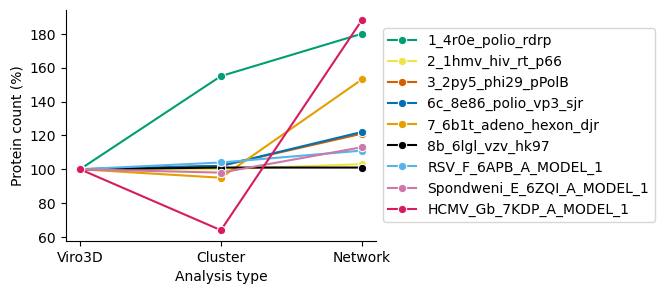

In [40]:
# plot the distribution of the number of clusters in the hallmark community with seaborn

plt.figure(figsize=(4, 3))

color_map = {
    '1_4r0e_polio_rdrp': '#009E73', 
    '2_1hmv_hiv_rt_p66': '#F0E442', 
    '3_2py5_phi29_pPolB': '#D55E00',
    '6c_8e86_polio_vp3_sjr': '#0072B2',
    '7_6b1t_adeno_hexon_djr': '#E69F00',
    '8b_6lgl_vzv_hk97': '#000000',
    'RSV_F_6APB_A_MODEL_1': '#56B4E9',
    'Spondweni_E_6ZQI_A_MODEL_1': '#CC79A7',
    'HCMV_Gb_7KDP_A_MODEL_1': '#D81B60',
}

for hallmark in hallmark_list:
    sns.lineplot(data=df_hallmark_records, x='type', y=f'{hallmark}', marker='o', label=f'{hallmark}', color=color_map[hallmark])

# move the legend outside the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# relabel the x-axis
plt.xlabel('Analysis type')

# relabel the x-ticks
plt.xticks(range(3), ['Viro3D', 'Cluster', 'Network'])

# relabel the y-axis
plt.ylabel('Protein count (%)')

sns.despine()

#plt.savefig('./figures/network_communities_lineplot/hallmark_protein_count_with_cluster.svg', bbox_inches='tight')

plt.show()

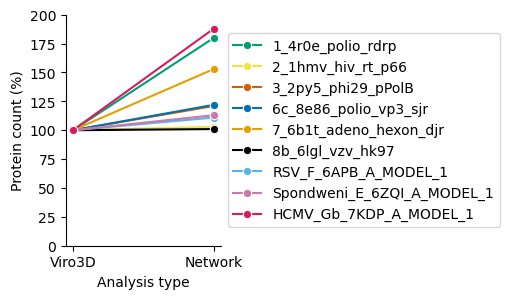

In [45]:
# plot the distribution of the number of clusters in the hallmark community with seaborn

plt.figure(figsize=(2, 3))

color_map = {
    '1_4r0e_polio_rdrp': '#009E73', 
    '2_1hmv_hiv_rt_p66': '#F0E442', 
    '3_2py5_phi29_pPolB': '#D55E00',
    '6c_8e86_polio_vp3_sjr': '#0072B2',
    '7_6b1t_adeno_hexon_djr': '#E69F00',
    '8b_6lgl_vzv_hk97': '#000000',
    'RSV_F_6APB_A_MODEL_1': '#56B4E9',
    'Spondweni_E_6ZQI_A_MODEL_1': '#CC79A7',
    'HCMV_Gb_7KDP_A_MODEL_1': '#D81B60',
}

for hallmark in hallmark_list:
    sns.lineplot(data=df_hallmark_records[df_hallmark_records['type'] != 'cluster'],
                 x='type', y=f'{hallmark}', marker='o', label=f'{hallmark}',
                 color=color_map[hallmark], alpha=1)

# move the legend outside the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# relabel the x-axis
plt.xlabel('Analysis type')

# relabel the x-ticks
plt.xticks(range(2), ['Viro3D', 'Network'])

# relabel the y-axis
plt.ylabel('Protein count (%)')

# y-axis limits from 0 to 2
plt.ylim(0, 200)

# remove the top and right spines
sns.despine()

plt.savefig('./figures/network_communities_lineplot/hallmark_protein_count_perecentage.svg', bbox_inches='tight')

plt.show()

In [ ]:
# Initialize the dictionary to store unique records for each hallmark
unique_records = {}

# Iterate through the records
for hallmark, values in hallmark_viro3d_records.items():
    
    # Initialize the list for the hallmark if not already present
    if hallmark not in unique_records:
        unique_records[hallmark] = values.difference(hallmark_network_records[hallmark])

for hallmark, values in unique_records.items():
    print(hallmark, len(values))


In [ ]:
# Initialize the dictionary to store unique records for each hallmark
unique_records = {}

# Iterate through the records
for hallmark, values in hallmark_network_records.items():
    
    # Initialize the list for the hallmark if not already present
    if hallmark not in unique_records:
        unique_records[hallmark] = values.difference(hallmark_viro3d_records[hallmark])

for hallmark, values in unique_records.items():
    print(hallmark, len(values))

## Make a dataframe of proteins with structural similarity to hallmark proteins

In [6]:
hallmark_network_dict = {'hallmark': [], 'cluster_id': []}

for hallmark, cluster_set in hallmark_clusters.items():
    for cluster in cluster_set:
        hallmark_network_dict['hallmark'].append(hallmark)
        hallmark_network_dict['cluster_id'].append(cluster)

df_hallmark_network = pd.DataFrame(hallmark_network_dict)

In [7]:
df_hallmark_network = df_hallmark_network.merge(df_meta[[
    'cluster_id',
    'structure_representative',
    'cluster_member',
    'protlen',
    'plddt',
    'ptm',
    'ictv_sort',
    'ictv_species',
    'genbank_name']], on='cluster_id', how='left')

In [8]:
file_ictv = "~/1_dataset_preparation/msl38v2/VMR_MSL38_v2.xlsx"
df_ictv = pd.read_excel(file_ictv)

In [9]:
df_hallmark_network = df_hallmark_network.merge(df_ictv[['Sort', 'Realm', 'Family']], left_on='ictv_sort', right_on='Sort', how='left')
df_hallmark_network.drop(columns=['Sort'], inplace=True)
df_hallmark_network.rename(columns={'Realm': 'ictv_realm', 'Family': 'ictv_family'}, inplace=True)
df_hallmark_network = df_hallmark_network[[
    'hallmark',
    'cluster_id',
    'structure_representative',
    'cluster_member',
    'protlen',
    'plddt',
    'ptm',
    'ictv_sort',
    'ictv_realm',
    'ictv_family',
    'ictv_species',
    'genbank_name']]
df_hallmark_network['ictv_realm'].fillna('Unclassified', inplace=True)

In [10]:
df_hallmark_network[df_hallmark_network['hallmark'] == 'HCMV_Gb_7KDP_A_MODEL_1']['ictv_sort'].unique().shape

(489,)

In [11]:
hallmark_cluster_dict = {'hallmark': [], 'cluster_id':[]}

for hallmark, cluster_set in hallmark_clusters.items():
    for cluster in cluster_set:
        hallmark_cluster_dict['hallmark'].append(hallmark)
        hallmark_cluster_dict['cluster_id'].append(cluster)

df_hallmark_cluster = pd.DataFrame(hallmark_cluster_dict)

In [12]:
for cluster_id in df_hallmark_network['cluster_id'].unique():
    if cluster_id in df_hallmark_cluster['cluster_id'].unique():
        df_hallmark_network.loc[df_hallmark_network['cluster_id'] == cluster_id, 'foldseek'] = 'cluster'
    else:
        df_hallmark_network.loc[df_hallmark_network['cluster_id'] == cluster_id, 'foldseek'] = 'network'

In [15]:
df_hallmark_network['hallmark'].unique()

array(['1_4r0e_polio_rdrp', '2_1hmv_hiv_rt_p66', '3_2py5_phi29_pPolB',
       '6c_8e86_polio_vp3_sjr', '7_6b1t_adeno_hexon_djr',
       '8b_6lgl_vzv_hk97', 'RSV_F_6APB_A_MODEL_1',
       'Spondweni_E_6ZQI_A_MODEL_1', 'HCMV_Gb_7KDP_A_MODEL_1'],
      dtype=object)

In [20]:
df_hallmark_network[df_hallmark_network['hallmark'] == 'RSV_F_6APB_A_MODEL_1']['ictv_sort'].unique().shape

(258,)

In [21]:
df_hallmark_network[df_hallmark_network['hallmark'] == 'RSV_F_6APB_A_MODEL_1']

,hallmark,cluster_id,structure_representative,cluster_member,protlen,plddt,ptm,ictv_sort,ictv_realm,ictv_family,ictv_species,genbank_name,foldseek
6180,RSV_F_6APB_A_MODEL_1,1349,CF-AYN64864.1_8569_relaxed,CF-QHA33673.1_8558_relaxed,1182,44.4,0.29,8558,Riboviria,Aliusviridae,Obscuruvirus quintum,Product: hypothetical protein 1; Note: Baculo_...,cluster
6181,RSV_F_6APB_A_MODEL_1,1349,CF-AYN64864.1_8569_relaxed,CF-AYN64864.1_8569_relaxed,1230,51.9,0.35,8569,Riboviria,Aliusviridae,Ollusvirus taiyuanense,Product: glycoprotein,cluster
6182,RSV_F_6APB_A_MODEL_1,1349,CF-AYN64864.1_8569_relaxed,CF-APG78685.1_8559_relaxed,1202,33.2,0.32,8559,Riboviria,Aliusviridae,Ollusvirus coleopteri,Product: putative glycoprotein,cluster
6183,RSV_F_6APB_A_MODEL_1,1349,CF-AYN64864.1_8569_relaxed,CF-QPB73968.1_8563_relaxed,1047,45.3,0.28,8563,Riboviria,Aliusviridae,Ollusvirus insectii,Product: glycoprotein,cluster
6184,RSV_F_6APB_A_MODEL_1,1349,CF-AYN64864.1_8569_relaxed,CF-DAZ89738.1_8564_relaxed,1064,46.5,0.31,8564,Riboviria,Aliusviridae,Ollusvirus nomadae,Product: glycoprotein,cluster
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6434,RSV_F_6APB_A_MODEL_1,920,CF-AKV63205.1_10208_relaxed,CF-AFD29201.1_10202_relaxed,1179,64.7,0.47,10202,Riboviria,Coronaviridae,White-eye coronavirus HKU16,Gene: S; Product: spike glycoprotein,cluster
6435,RSV_F_6APB_A_MODEL_1,920,CF-AKV63205.1_10208_relaxed,CF-AFD29194.1_10200_relaxed,1159,68.9,0.41,10200,Riboviria,Coronaviridae,Coronavirus HKU15,Gene: S; Product: spike glycoprotein,cluster
6436,RSV_F_6APB_A_MODEL_1,920,CF-AKV63205.1_10208_relaxed,CF-AFD29226.1_10203_relaxed,1254,64.1,0.50,10203,Riboviria,Coronaviridae,Night heron coronavirus HKU19,Gene: S; Product: spike glycoprotein,cluster
6437,RSV_F_6APB_A_MODEL_1,920,CF-AKV63205.1_10208_relaxed,CF-ACJ12035.1_10198_relaxed,1165,66.8,0.50,10198,Riboviria,Coronaviridae,Bulbul coronavirus HKU11,Gene: S; Product: spike glycoprotein,cluster


In [22]:
df_hallmark_network[df_hallmark_network['hallmark'] == 'RSV_F_6APB_A_MODEL_1'].to_csv("foldseek_1e-5_all_hallmark_vs_network_JG.csv", index=False)

In [19]:
df_hallmark_network.to_csv("foldseek_1e-5_all_hallmark_vs_network_RSV_F_6APB_A_MODEL_1.csv", index=False)

In [2]:
hallmark_network_file = "foldseek_1e-5_all_hallmark_vs_network_RSV_F_6APB_A_MODEL_1.csv"
df_hallmark_network = pd.read_csv(hallmark_network_file)

In [3]:
df_hallmark_network.columns

Index(['hallmark', 'cluster_id', 'structure_representative', 'cluster_member',
       'protlen', 'plddt', 'ptm', 'ictv_sort', 'ictv_realm', 'ictv_family',
       'ictv_species', 'genbank_name', 'foldseek'],
      dtype='object')

In [8]:
df_hallmark_network[(df_hallmark_network['hallmark'] == 'RSV_F_6APB_A_MODEL_1') & (df_hallmark_network['ictv_family'] == 'Alloherpesviridae')].sort_values(by='plddt', ascending=False)

,hallmark,cluster_id,structure_representative,cluster_member,protlen,plddt,ptm,ictv_sort,ictv_realm,ictv_family,ictv_species,genbank_name,foldseek
6198,RSV_F_6APB_A_MODEL_1,1547,CF-AUG72299.1_42_relaxed,CF-AUG72299.1_42_relaxed,1384,53.4,0.36,42,Duplodnaviria,Alloherpesviridae,Ictavirus ictaluridallo2,Product: ORF46,cluster
6204,RSV_F_6APB_A_MODEL_1,1547,CF-AUG72299.1_42_relaxed,CF-ABG25578.1_34_relaxed,1259,52.8,0.32,34,Duplodnaviria,Alloherpesviridae,Batravirus ranidallo2,Product: ORF72,cluster
6199,RSV_F_6APB_A_MODEL_1,1547,CF-AUG72299.1_42_relaxed,CF-AAA88149.1_41_relaxed,1355,52.1,0.33,41,Duplodnaviria,Alloherpesviridae,Ictavirus ictaluridallo1,Gene: ORF46; Note: membrane glycoprotein; cons...,cluster
6197,RSV_F_6APB_A_MODEL_1,1547,CF-AUG72299.1_42_relaxed,CF-AEF97704.1_40_relaxed,1293,51.9,0.42,40,Duplodnaviria,Alloherpesviridae,Ictavirus acipenseridallo2,Product: ORF46,cluster
6202,RSV_F_6APB_A_MODEL_1,1547,CF-AUG72299.1_42_relaxed,CF-ABG25710.1_33_relaxed,1186,51.3,0.30,33,Duplodnaviria,Alloherpesviridae,Batravirus ranidallo1,Product: ORF46,cluster
6200,RSV_F_6APB_A_MODEL_1,1547,CF-AUG72299.1_42_relaxed,CF-ARR28921.1_35_relaxed,1250,48.9,0.32,35,Duplodnaviria,Alloherpesviridae,Batravirus ranidallo3,Product: hypothetical protein; Note: ORF97; si...,cluster


## Visualise the network

In [6]:
# read the graph
import json
import networkx as nx
from networkx.readwrite import json_graph

# Load the JSON data from a file
with open("~/6_network_analysis/foldseekCluster90_1E-5_structure_similarity_network_1E-3_plddt_above_50.json", 'r') as f:
    data = json.load(f)

# Create a new graph from the JSON data
G = json_graph.node_link_graph(data)

In [7]:
# Read positions from the file
with open("~/6_network_analysis/node_positions_network_1E-3_plddt_above_50_k0.4_iter500.json", 'r') as f:
    pos = json.load(f)

# Convert keys back to integers if necessary
pos = {int(k): v for k, v in pos.items()}

In [ ]:
color_map = {
    '1_4r0e_polio_rdrp': '#000000',
    '7_6b1t_adeno_hexon_djr': '#E69F00',
    '8b_6lgl_vzv_hk97': '#56B4E9',
    'Spondweni_E_6ZQI_A_MODEL_1': '#009E73',
    '6b_8e86_polio_vp2_sjr': '#F0E442',
    'SARS2_S_6VYB_A_MODEL_1': '#0072B2',
    'RSV_F_6APB_A_MODEL_1': '#CC79A7',
    'HCMV_Gb_7KDP_A_MODEL_1': '#D55E00'
}

node_color = []

number = 0

for n, d in G.nodes(data=True):
    for hallmark_type, cluster_ids in hallmark_clusters.items():
        if n in cluster_ids:
            node_color.append(color_map[hallmark_type])
    if number == len(node_color): 
        node_color.append('lightgrey')
    number += 1

In [17]:
color_map = {
    '1_4r0e_polio_rdrp': '#009E73', 
    '2_1hmv_hiv_rt_p66': '#F0E442', 
    '3_2py5_phi29_pPolB': '#D55E00',
    '6c_8e86_polio_vp3_sjr': '#0072B2',
    '7_6b1t_adeno_hexon_djr': '#E69F00',
    '8b_6lgl_vzv_hk97': '#000000',
    'RSV_F_6APB_A_MODEL_1': '#56B4E9',
    'Spondweni_E_6ZQI_A_MODEL_1': '#CC79A7',
    'HCMV_Gb_7KDP_A_MODEL_1': '#D81B60',
}

node_color = []

number = 0

for n, d in G.nodes(data=True):
    for hallmark_type, cluster_ids in hallmark_clusters.items():
        if n in cluster_ids:
            node_color.append(color_map[hallmark_type])
    if number == len(node_color): 
        node_color.append('lightgrey')
    number += 1

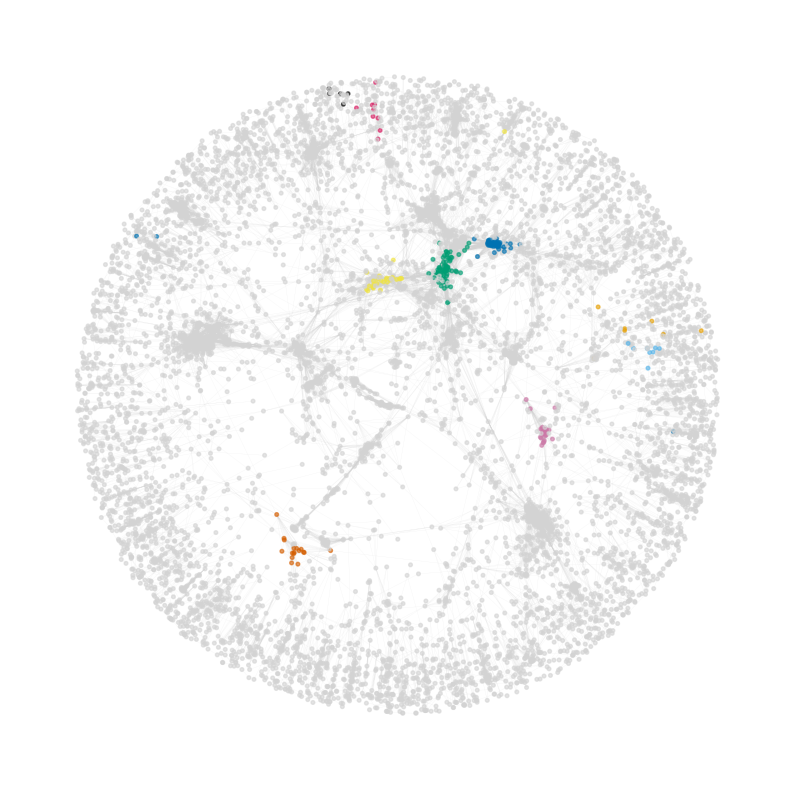

In [27]:
# Draw the graph
plt.figure(figsize=(10, 10))

# Draw the graph
nx.draw_networkx_nodes(
    G, pos,
    node_size=7,
    node_color=node_color, alpha=0.6)

# Draw the edges
nx.draw_networkx_edges(
    G, pos, edge_color='lightgray', alpha=0.5, width=0.1)

# Create legend
#import matplotlib.patches as mpatches
#legend_handles = [mpatches.Patch(color=color_map[rank], label=rank) for rank in color_map.keys()]
#plt.legend(handles=legend_handles, title="Hallmark protein", bbox_to_anchor=(1.05, 1), loc='upper left')

# remove the frame
plt.axis('off')

# save the plot as svg
plt.savefig("./figures/network_communities/foldseekCluster90_0.4_500_hallmark_communities.png", dpi=600, bbox_inches='tight')
plt.savefig("./figures/network_communities/foldseekCluster90_0.4_500_hallmark_communities.svg", format='svg', bbox_inches='tight')

plt.show()

In [ ]:
for n, d in G.nodes(data=True):
    
    pfam_annotation = df_stats[df_stats['cluster_id'] == n]['Pfam_annotation'].values[0]
    molecular_function = df_stats[df_stats['cluster_id'] == n]['molecular_function_annotation'].values[0]
    biological_process = df_stats[df_stats['cluster_id'] == n]['biological_process_annotation'].values[0]
    cellular_component = df_stats[df_stats['cluster_id'] == n]['cellular_component_annotation'].values[0]

    G.nodes[n]['pfam_annotation'] = pfam_annotation
    G.nodes[n]['molecular_function'] = molecular_function
    G.nodes[n]['biological_process'] = biological_process
    G.nodes[n]['cellular_component'] = cellular_component

    print(n, pfam_annotation, molecular_function, biological_process, cellular_component, sep='\t')

In [29]:
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

edge_dict = {'edge_x': [],
             'edge_y': [],
             'edge_info': []}

for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_dict['edge_x'].append(x0)
    edge_dict['edge_x'].append(x1)
    edge_dict['edge_x'].append(None)
    edge_dict['edge_y'].append(y0)
    edge_dict['edge_y'].append(y1)
    edge_dict['edge_y'].append(None)

edge_trace = go.Scatter(
    x=edge_dict['edge_x'],
    y=edge_dict['edge_y'],
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

In [30]:
node_dict = {
    'node_x': [],
    'node_y': [],
    'info': []}

for node in G.nodes(data=True):
    x, y = pos[node[0]]
    node_dict['node_x'].append(x)
    node_dict['node_y'].append(y)
    node_dict['info'].append(f"Cluster ID: {node[0]}<br>Cluster size: {node[1]['cluster_size']}<br>Pfam: {node[1]['pfam_annotation']}<br>Molecular function: {node[1]['molecular_function']}<br>Biological process: {node[1]['biological_process']}<br>Cellular component: {node[1]['cellular_component']}")

node_trace = go.Scatter(
    x=node_dict['node_x'],
    y=node_dict['node_y'],
    mode='markers',
    hoverinfo='text',
    text=node_dict['info'],
    marker=dict(
        showscale=True,
        # colorscale options
        #'Greys' | 'YlGnBu' | 'Greens' | 'YlOrRd' | 'Bluered' | 'RdBu' |
        #'Reds' | 'Blues' | 'Picnic' | 'Rainbow' | 'Portland' | 'Jet' |
        #'Hot' | 'Blackbody' | 'Earth' | 'Electric' | 'Viridis' |
        colorscale='YlGnBu',
        reversescale=True,
        color=[],
        size=10,
        colorbar=dict(
            thickness=15,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        ),
        line_width=2))

In [32]:
# Create the Plotly figure
fig = go.Figure(layout=go.Layout(plot_bgcolor='white', paper_bgcolor='white'))

# Make figure 12 x 12 inches
fig.update_layout(
    width=1200,
    height=1200,
    showlegend=False,
    hovermode='closest',
    margin=dict(b=20,l=5,r=5,t=40),
    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))

# Add edges
fig.add_trace(go.Scatter(
    x=edge_dict['edge_x'], y=edge_dict['edge_y'],
    line=dict(width=0.35, color='lightgray'),
    hoverinfo='none',
    mode='lines'))

# Add nodes
fig.add_trace(go.Scatter(
    x=node_dict['node_x'], y=node_dict['node_y'],
    mode='markers',
    hoverinfo='text',
    text=node_dict['info'],
    marker=dict(
        size=6,
        color=node_color,
        opacity=0.8,
        line=dict(width=0.1, color='black')
        )
    )
)

# Update layout
fig.update_layout(showlegend=False)

# Save the figure as an HTML file
fig.write_html("./foldseekCluster90_1e-5_hallmark_communities.html")

fig.show()

## Realm distribution heatmap

In [6]:
file_ictv = "~/1_dataset_preparation/msl38v2/VMR_MSL38_v2.xlsx"
df_ictv = pd.read_excel(file_ictv)

In [7]:
# Step 1: Extract unique ictv_sort values from df_meta
ictv_sorts = df_meta['ictv_sort'].unique()

In [8]:
# leave only rows if Sort in ictv_sorts
df_ictv = df_ictv[df_ictv['Sort'].isin(ictv_sorts)]
# replace NaN in Realm with 'Unclassified'
df_ictv['Realm'] = df_ictv['Realm'].fillna('Unclassified')

In [9]:
df_ictv['Realm'].value_counts()

Realm
Riboviria        2475
Monodnaviria     1080
Varidnaviria      327
Unclassified      302
Duplodnaviria     132
Ribozyviria        14
Name: count, dtype: int64

In [36]:
# Step 1: Extract unique realms from df_ictv
realms = df_ictv['Realm'].unique()

# Step 2: Extract unique cluster IDs from df_stats where ictv_lca_rank is superkingdom
#cluster_ids = df_stats[df_stats['ictv_lca_rank'] == 'Superkingdom']['cluster_id'].unique()

# Step 3: Initialize a DataFrame with realms as rows and cluster IDs as columns
result_df = pd.DataFrame(index=realms, columns=hallmark_list)

#hallmark_realm_clusters = {}

# Step 4: Calculate the percentage of ICTV Sort codes from each realm found in each cluster ID
for realm in realms:
    
    # Get the ICTV Sort codes for the current realm
    ictv_sort_codes_realm = df_ictv[df_ictv['Realm'] == realm]['Sort']
    
    for hallmark, cluster_ids in hallmark_clusters.items():
        
        # Initialize a list to store the ICTV Sort codes for the current hallmark community
        ictv_sort_codes_community = set()

        #hallmark_realm_clusters[hallmark] = {f'{realm}': set()}
        
        for cluster_id in cluster_ids:

            # Get the ICTV Sort codes for the current cluster_id
            ictv_sort_codes_cluster = set(df_meta[df_meta['cluster_id'] == cluster_id]['ictv_sort'])
            
            # Add the ICTV Sort codes to the community list
            ictv_sort_codes_community.update(ictv_sort_codes_cluster)

        # Calculate the intersection and percentage
        intersection_count = len(set(ictv_sort_codes_realm) & set(ictv_sort_codes_community))
        total_count = len(ictv_sort_codes_realm)
        
        #percentage = round((intersection_count / total_count),4) * 100 if total_count > 0 else 0
        
        # Fill the DataFrame
        result_df.at[realm, hallmark] = intersection_count

In [37]:
# merge df_meta with df_ictv['Sort, 'Realm'] on ictv_sort
df_meta = pd.merge(df_meta, df_ictv[['Sort', 'Realm']], left_on='ictv_sort', right_on='Sort', how='left')
df_meta.drop(columns=['Sort'], inplace=True)

In [38]:
# make an empty df with two column names 'hallmark' and 'cluster_id'
df_hallmark_clusters = pd.DataFrame(columns=['hallmark', 'cluster_id'])

for hallmark, cluster_ids in hallmark_clusters.items():

    for cluster_id in cluster_ids:
        
        # make a new row with the hallmark and cluster_id information
        new_row = pd.DataFrame([{'hallmark': hallmark, 'cluster_id': cluster_id}])

        # append the new row to the df_hallmark_clusters
        df_hallmark_clusters = pd.concat([df_hallmark_clusters, new_row], ignore_index=True)

In [39]:
# concatenate df_hallmark_clusters with df_meta on cluster_id
df_hallmark_clusters = pd.merge(df_hallmark_clusters, df_meta[[
    'cluster_id',
    'cluster_representative',
    'structure_representative',
    'cluster_member',
    'clustering_method',
    'protlen',
    'plddt',
    'Realm',
    'ictv_sort',
    'ictv_species',
    'genbank_name']], on='cluster_id', how='left')

In [13]:
df_hallmark_clusters[(df_hallmark_clusters['hallmark'] == '1_4r0e_polio_rdrp') & (df_hallmark_clusters['Realm'] == 'Varidnaviria')]

,hallmark,cluster_id,cluster_representative,structure_representative,cluster_member,clustering_method,protlen,plddt,Realm,ictv_sort,ictv_species,genbank_name
1543,1_4r0e_polio_rdrp,1683,EF-QHR78449.1_11900_relaxed,CF-AAG53584.1_10123_relaxed,EF-AAU10897.1_11898_relaxed,mmseq,483,92.0,Varidnaviria,11898,Lymphocystis disease virus 2,Product: RNA-dependent DNA polymerase
1547,1_4r0e_polio_rdrp,1683,EF-QHR78449.1_11900_relaxed,CF-AAG53584.1_10123_relaxed,EF-AOC55195.1_11899_relaxed,mmseq,487,93.3,Varidnaviria,11899,Lymphocystis disease virus 3,Product: RNA-dependent DNA polymerase
1548,1_4r0e_polio_rdrp,1683,EF-QHR78449.1_11900_relaxed,CF-AAG53584.1_10123_relaxed,EF-QHR78449.1_11900_relaxed,foldseek,484,93.7,Varidnaviria,11900,Lymphocystis disease virus 4,Product: RNA-dependent DNA polymerase
1695,1_4r0e_polio_rdrp,8491,EF-AAC97621.1_12053_relaxed,EF-AAC97621.1_12053_relaxed,EF-AAC97621.1_12053_relaxed,foldseek,531,85.3,Varidnaviria,12053,Melanoplus sanguinipes entomopoxvirus,Gene: MSV061; Product: ORF MSV061 putative LIN...


In [50]:
result_df

,Riboviria,Monodnaviria,Unclassified,Varidnaviria,Duplodnaviria
RdRp,2141,0,0,4,0
RT,110,0,0,1,0
DNAP B,0,1,116,281,121
SJR MCP,730,100,101,0,0
DJR MCP,0,0,0,308,0
HK97 MCP,0,0,0,0,119
Class 1 FP,153,0,97,0,8
Class 2 FP,576,0,0,0,4
Class 3 FP,344,0,24,7,114


In [44]:
result_df.columns

Index(['1_4r0e_polio_rdrp', '2_1hmv_hiv_rt_p66', '3_2py5_phi29_pPolB',
       '6c_8e86_polio_vp3_sjr', '7_6b1t_adeno_hexon_djr', '8b_6lgl_vzv_hk97',
       'RSV_F_6APB_A_MODEL_1', 'Spondweni_E_6ZQI_A_MODEL_1',
       'HCMV_Gb_7KDP_A_MODEL_1'],
      dtype='object')

In [42]:
# drop ribozyviria row
result_df.drop('Ribozyviria', inplace=True)

In [45]:
# rename column 1_4r0e_polio_rdrp to RdRp
result_df.rename(columns={
    '1_4r0e_polio_rdrp': 'RdRp',
    '2_1hmv_hiv_rt_p66': 'RT',
    '3_2py5_phi29_pPolB': 'DNAP B',
    '6c_8e86_polio_vp3_sjr': 'SJR MCP',
    '7_6b1t_adeno_hexon_djr': 'DJR MCP',
    '8b_6lgl_vzv_hk97': 'HK97 MCP',
    'RSV_F_6APB_A_MODEL_1': 'Class 1 FP',
    'Spondweni_E_6ZQI_A_MODEL_1': 'Class 2 FP',
    'HCMV_Gb_7KDP_A_MODEL_1': 'Class 3 FP'
    }, inplace=True)

In [47]:
# swap rows and columns
result_df = result_df.transpose()

In [49]:
# change the column order
result_df = result_df[[
    'Riboviria',
    'Monodnaviria',
    'Unclassified',
    'Varidnaviria',
    'Duplodnaviria']]

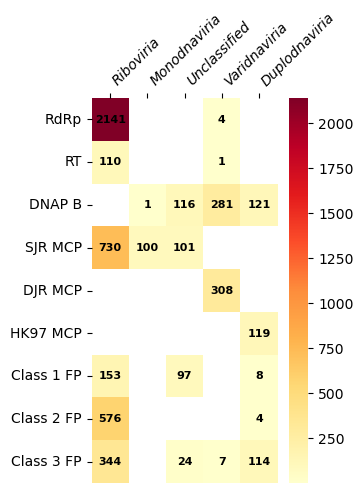

In [ ]:
# Convert all values in result_df to numeric, coercing errors to NaN
result_df = result_df.apply(pd.to_numeric, errors='coerce')

# Select the first 10 columns
result_df_first_10 = result_df

# Create a mapping from cluster_id to Pfam annotation
#cluster_to_pfam = df_stats.set_index('cluster_id')['cluster_pfam'].to_dict()

# Replace column names with Pfam annotations
#result_df_first_10.columns = [cluster_to_pfam.get(col, col) for col in result_df_first_10.columns]

# Create a mask for zero values
mask = result_df_first_10 == 0

# Create a custom colormap
#cmap = sns.color_palette("YlOrRd", as_cmap=True)
cmap = sns.color_palette("YlGnBu", as_cmap=True)
cmap.set_bad(color='white')

# Create a heatmap
plt.figure(figsize=(3, 5))
ax = sns.heatmap(result_df_first_10, cmap=cmap, annot=True, fmt=".0f", mask=mask, annot_kws={"color": "black", "size": 8, "weight": "bold"})

# Move x-axis labels to the top
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')
plt.xticks(rotation=45, ha='left')

# Italicize y-axis labels
#ax.set_yticklabels(ax.get_yticklabels(), fontstyle='italic')
ax.set_xticklabels(ax.get_xticklabels(), fontstyle='italic')

plt.savefig('./figures/network_communities/foldseekCluster90_1e-5_hallmark_communities.png', dpi=600, bbox_inches='tight')
plt.savefig('./figures/network_communities/foldseekCluster90_1e-5_hallmark_communities.svg', bbox_inches='tight')

plt.show()

## Family distribution heatmap

In [8]:
file_ictv = "~/1_dataset_preparation/msl38v2/VMR_MSL38_v2.xlsx"
df_ictv = pd.read_excel(file_ictv)

In [30]:
file_meta = "~/2_protein_structure_prediction/virosphere-fold-v1_predicted_dataset.csv"
df_meta = pd.read_csv(file_meta)

In [31]:
df_meta.columns

Index(['record_id', 'uniprot_id', 'pept_cat', 'protlen', 'genbank_name',
       'gene', 'product', 'note', 'protein_id', 'mat_pept_id', 'reg_id',
       'uniq_id', 'uniprot_match_status', 'nt_acc', 'acc', 'seg', 'taxid',
       'Sort', 'Realm', 'Subrealm', 'Kingdom', 'Subkingdom', 'Phylum',
       'Subphylum', 'Class', 'Subclass', 'Order', 'Suborder', 'Family',
       'Subfamily', 'Genus', 'Subgenus', 'Species',
       'Exemplar or additional isolate', 'Virus name(s)',
       'Virus name abbreviation(s)', 'Virus isolate designation',
       'Virus REFSEQ accession', 'Genome coverage', 'Genome composition',
       'Host source', 'host', 'genbank_genome_coordinates',
       'genome_coordinates', 'protein_coordinates', 'esmfold_log_pLDDT',
       'esmfold_log_pTM', 'colabfold_json_pLDDT', 'colabfold_json_pTM', 'PC1',
       'PC2', 'PC3', 'protein_seq', 'structure_seq', 'genome_length_bp',
       'genbank_name_curated'],
      dtype='object')

In [54]:
df_meta_ictv = df_meta[[
    'Sort',
    'Realm',
    'Subrealm',
    'Kingdom',
    'Subkingdom',
    'Phylum',
    'Subphylum',
    'Class',
    'Subclass',
    'Order',
    'Suborder',
    'Family',
    'Subfamily',
    'Genus',
    'Species',
]].drop_duplicates()

In [55]:
df_meta_ictv.sort_values(by=['Realm', 'Subrealm', 'Kingdom', 'Subkingdom', 'Phylum', 'Subphylum', 'Class', 'Subclass', 'Order', 'Suborder', 'Family'], inplace=True)

In [58]:
df_family_count = df_meta_ictv['Family'].value_counts().to_frame()

In [9]:
# Step 1: Extract unique ictv_sort values from df_meta
ictv_sorts = df_meta['ictv_sort'].unique()

In [10]:
# leave only rows if Sort in ictv_sorts
df_ictv = df_ictv[df_ictv['Sort'].isin(ictv_sorts)]
# replace NaN in Realm with 'Unclassified'
df_ictv['Family'] = df_ictv['Family'].fillna('Unclassified')

In [11]:
# Step 1: Extract unique realms from df_ictv
realms = df_ictv['Family'].unique()

# Step 2: Extract unique cluster IDs from df_stats where ictv_lca_rank is superkingdom
#cluster_ids = df_stats[df_stats['ictv_lca_rank'] == 'Superkingdom']['cluster_id'].unique()

# Step 3: Initialize a DataFrame with realms as rows and cluster IDs as columns
result_df = pd.DataFrame(index=realms, columns=hallmark_list)

#hallmark_realm_clusters = {}

# Step 4: Calculate the percentage of ICTV Sort codes from each realm found in each cluster ID
for realm in realms:
    
    # Get the ICTV Sort codes for the current realm
    ictv_sort_codes_realm = df_ictv[df_ictv['Family'] == realm]['Sort']
    
    for hallmark, cluster_ids in hallmark_clusters.items():
        
        # Initialize a list to store the ICTV Sort codes for the current hallmark community
        ictv_sort_codes_community = set()

        #hallmark_realm_clusters[hallmark] = {f'{realm}': set()}
        
        for cluster_id in cluster_ids:

            # Get the ICTV Sort codes for the current cluster_id
            ictv_sort_codes_cluster = set(df_meta[df_meta['cluster_id'] == cluster_id]['ictv_sort'])
            
            # Add the ICTV Sort codes to the community list
            ictv_sort_codes_community.update(ictv_sort_codes_cluster)

        # Calculate the intersection and percentage
        intersection_count = len(set(ictv_sort_codes_realm) & set(ictv_sort_codes_community))
        total_count = len(ictv_sort_codes_realm)
        
        #percentage = round((intersection_count / total_count),4) * 100 if total_count > 0 else 0
        
        # Fill the DataFrame
        result_df.at[realm, hallmark] = intersection_count

In [12]:
# merge df_meta with df_ictv['Sort, 'Realm'] on ictv_sort
df_meta = pd.merge(df_meta, df_ictv[['Sort', 'Family']], left_on='ictv_sort', right_on='Sort', how='left')
df_meta.drop(columns=['Sort'], inplace=True)

In [13]:
# make an empty df with two column names 'hallmark' and 'cluster_id'
df_hallmark_clusters = pd.DataFrame(columns=['hallmark', 'cluster_id'])

for hallmark, cluster_ids in hallmark_clusters.items():

    for cluster_id in cluster_ids:
        
        # make a new row with the hallmark and cluster_id information
        new_row = pd.DataFrame([{'hallmark': hallmark, 'cluster_id': cluster_id}])

        # append the new row to the df_hallmark_clusters
        df_hallmark_clusters = pd.concat([df_hallmark_clusters, new_row], ignore_index=True)

In [14]:
# concatenate df_hallmark_clusters with df_meta on cluster_id
df_hallmark_clusters = pd.merge(df_hallmark_clusters, df_meta[[
    'cluster_id',
    'cluster_representative',
    'structure_representative',
    'cluster_member',
    'clustering_method',
    'protlen',
    'plddt',
    'Family',
    'ictv_sort',
    'ictv_species',
    'genbank_name']], on='cluster_id', how='left')

In [17]:
result_df

,RdRp,RT,PolB,RCRE,S3H,SJR MCP,DJR MCP,HK97 MCP,Class 1 FG,Class 2 FG,Class 3 FG
Alloherpesviridae,0,0,10,0,0,0,0,10,6,4,0
Malacoherpesviridae,0,0,0,0,0,0,0,2,2,0,0
Orthoherpesviridae,0,0,111,0,4,0,0,107,0,0,114
Bidnaviridae,0,0,1,0,1,0,0,0,0,0,0
Polyomaviridae,0,0,0,40,117,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
Nudiviridae,0,0,14,0,1,0,0,0,0,0,0
Nimaviridae,0,0,0,0,0,0,0,0,0,0,0
Alphasatellitidae,0,0,0,2,2,0,0,0,0,0,0
Anelloviridae,0,0,0,0,0,0,0,0,0,0,0


In [72]:
# merge result_df with df_family_count on index
result_df_mod = result_df.merge(df_family_count, left_index=True, right_index=True)
# concatenate result_df_mod index with count column
result_df_mod.index = result_df_mod.index + ' (' + result_df_mod['count'].astype(str) + ')'
# drop count column
result_df_mod.drop(columns=['count'], inplace=True)

In [73]:
result_df_mod

,RdRp,RT,PolB,RCRE,S3H,SJR MCP,DJR MCP,HK97 MCP,Class 1 FG,Class 2 FG,Class 3 FG
Alloherpesviridae (13),0,0,10,0,0,0,0,10,6,4,0
Malacoherpesviridae (2),0,0,0,0,0,0,0,2,2,0,0
Orthoherpesviridae (117),0,0,111,0,4,0,0,107,0,0,114
Bidnaviridae (1),0,0,1,0,1,0,0,0,0,0,0
Polyomaviridae (117),0,0,0,40,117,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
Nudiviridae (14),0,0,14,0,1,0,0,0,0,0,0
Nimaviridae (13),0,0,0,0,0,0,0,0,0,0,0
Alphasatellitidae (2),0,0,0,2,2,0,0,0,0,0,0
Anelloviridae (153),0,0,0,0,0,0,0,0,0,0,0


In [16]:
result_df.rename(columns={
    '1_4r0e_polio_rdrp': 'RdRp',
    '2_1hmv_hiv_rt_p66': 'RT',
    '3_2py5_phi29_pPolB': 'PolB',
    '4_8h56_circovirus_rcre': 'RCRE',
    '5_5a9k_papilloma_s3h': 'S3H',
    '6c_8e86_polio_vp3_sjr': 'SJR MCP',
    '7_6b1t_adeno_hexon_djr': 'DJR MCP',
    '8b_6lgl_vzv_hk97': 'HK97 MCP',
    'RSV_F_6APB_A_MODEL_1': 'Class 1 FG',
    'Spondweni_E_6ZQI_A_MODEL_1': 'Class 2 FG',
    'HCMV_Gb_7KDP_A_MODEL_1': 'Class 3 FG'
    }, inplace=True)


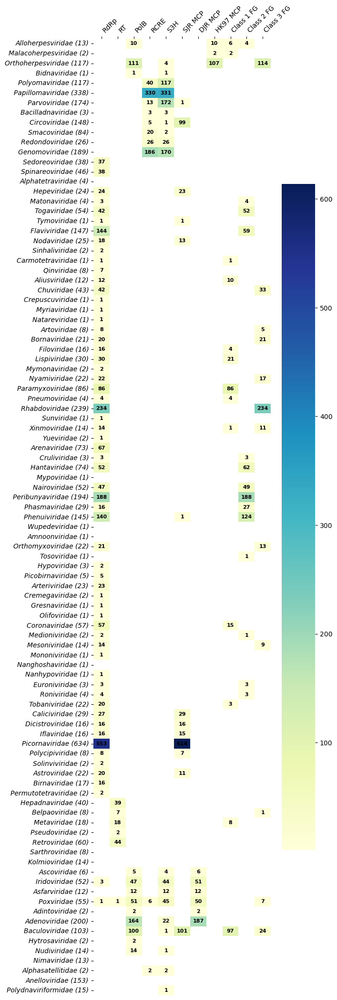

In [75]:
# Convert all values in result_df to numeric, coercing errors to NaN
#result_df = result_df.apply(pd.to_numeric, errors='coerce')

# Select the first 10 columns
result_df_first_10 = result_df_mod

# Create a mapping from cluster_id to Pfam annotation
#cluster_to_pfam = df_stats.set_index('cluster_id')['cluster_pfam'].to_dict()

# Replace column names with Pfam annotations
#result_df_first_10.columns = [cluster_to_pfam.get(col, col) for col in result_df_first_10.columns]

# Create a mask for zero values
mask = result_df_first_10 == 0

# Create a custom colormap
cmap = sns.color_palette("YlGnBu", as_cmap=True)
cmap.set_bad(color='white')

# Create a heatmap
plt.figure(figsize=(6, 26))
ax = sns.heatmap(result_df_first_10, cmap=cmap, annot=True, fmt=".0f", mask=mask, annot_kws={"color": "black", "size": 8, "weight": "bold"})

# Move x-axis labels to the top
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')
plt.xticks(rotation=45, ha='left')

# Italicize y-axis labels
ax.set_yticklabels(ax.get_yticklabels(), fontstyle='italic')

#plt.savefig('./figures/network_community_heatmap/foldseek_1e-5_all_hallmark_genes_against_cluster_reps_family_distribution.png', dpi=600, bbox_inches='tight')
plt.savefig('./figures/network_community_heatmap/foldseek_1e-5_all_hallmark_genes_against_cluster_reps_with_network_expansion_1e-5_and_90_coverage_family_distribution_ylgnbu.svg', bbox_inches='tight')
#plt.savefig('./figures/network_community_heatmap/foldseek_1e-5_all_hallmark_genes_against_viro3d_family_distribution.png', dpi=600, bbox_inches='tight')

plt.show()